Importing libraries

In [53]:
import pandas as pd
import numpy as np

import matplotlib.pyplot as plt
import seaborn as sns
import string
import nltk

from scipy import stats
from sklearn import metrics
from sklearn.metrics import *
from sklearn.metrics import confusion_matrix, classification_report
from sklearn.model_selection import train_test_split

import warnings
warnings.filterwarnings('ignore')

Loading Dataset

In [54]:
df_original = pd.read_csv('data.csv', encoding='latin1')

In [55]:
df1=df_original.copy()

In [56]:
#For sentiment analysis we only want tweet and sentiment Features
df=df1[['OriginalTweet','Sentiment']]

Overviewing Dataset

In [57]:
df1.head()

,UserName,ScreenName,Location,TweetAt,OriginalTweet,Sentiment
0,3799,48751,London,16-03-2020,@MeNyrbie @Phil_Gahan @Chrisitv https://t.co/i...,Neutral
1,3800,48752,UK,16-03-2020,advice Talk to your neighbours family to excha...,Positive
2,3801,48753,Vagabonds,16-03-2020,Coronavirus Australia: Woolworths to give elde...,Positive
3,3802,48754,NaN,16-03-2020,My food stock is not the only one which is emp...,Positive
4,3803,48755,NaN,16-03-2020,"Me, ready to go at supermarket during the #COV...",Extremely Negative


In [58]:
#checking for null values
df1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 41157 entries, 0 to 41156
Data columns (total 6 columns):
 #   Column         Non-Null Count  Dtype 
---  ------         --------------  ----- 
 0   UserName       41157 non-null  int64 
 1   ScreenName     41157 non-null  int64 
 2   Location       32567 non-null  object
 3   TweetAt        41157 non-null  object
 4   OriginalTweet  41157 non-null  object
 5   Sentiment      41157 non-null  object
dtypes: int64(2), object(4)
memory usage: 1.9+ MB


->we have null values in Location Column

In [59]:
df1.shape

(41157, 6)

->there are 41157 rows and 6 columns

In [60]:
df1.columns    #name of columns

Index(['UserName', 'ScreenName', 'Location', 'TweetAt', 'OriginalTweet',
       'Sentiment'],
      dtype='object')

In [61]:
df1.TweetAt.value_counts()

TweetAt
20-03-2020    3448
19-03-2020    3215
25-03-2020    2979
18-03-2020    2742
21-03-2020    2653
22-03-2020    2114
23-03-2020    2062
17-03-2020    1977
08-04-2020    1881
07-04-2020    1843
06-04-2020    1742
24-03-2020    1480
09-04-2020    1471
13-04-2020    1428
26-03-2020    1277
05-04-2020    1131
10-04-2020    1005
02-04-2020     954
11-04-2020     909
03-04-2020     810
12-04-2020     803
04-04-2020     767
16-03-2020     656
01-04-2020     630
27-03-2020     345
31-03-2020     316
14-04-2020     284
29-03-2020     125
30-03-2020      87
28-03-2020      23
Name: count, dtype: int64

In [62]:
df1['Location'].value_counts()

Location
London                          540
United States                   528
London, England                 520
New York, NY                    395
Washington, DC                  373
                               ... 
Staffordshire Moorlands           1
Kithchener ON                     1
Tulsa, Ok                         1
Watford, South Oxhey, Bushey      1
i love you so much || he/him      1
Name: count, Length: 12220, dtype: int64

-> there are 12220 different locations

In [63]:
df1.Sentiment.unique()

array(['Neutral', 'Positive', 'Extremely Negative', 'Negative',
       'Extremely Positive'], dtype=object)

In [64]:
sentiment_count = df1['Sentiment'].value_counts()
sentiment_count

Sentiment
Positive              11422
Negative               9917
Neutral                7713
Extremely Positive     6624
Extremely Negative     5481
Name: count, dtype: int64

-> There are 5 different type of sentiments in our dataset

In [65]:
sentiment_count_df = sentiment_count.reset_index()
sentiment_count_df.columns = ['Sentiment', 'Count']

Text(0, 0.5, 'Count')

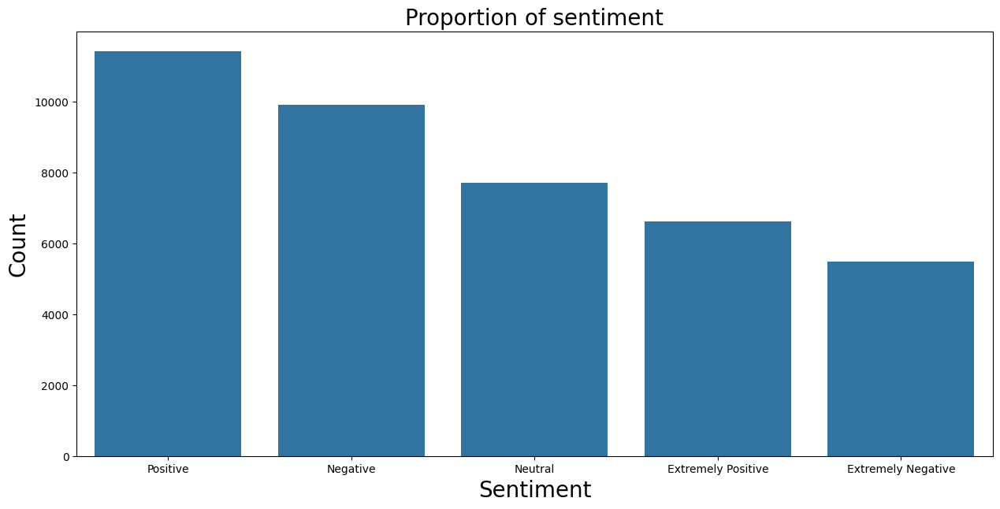

In [66]:
plt.figure(figsize=(15,7))
ax = sns.barplot(x="Sentiment", y="Count", data = sentiment_count_df)
ax.set_title("Proportion of sentiment", fontsize = 20)
ax.set_xlabel("Sentiment", fontsize = 20)
ax.set_ylabel("Count", fontsize = 20)

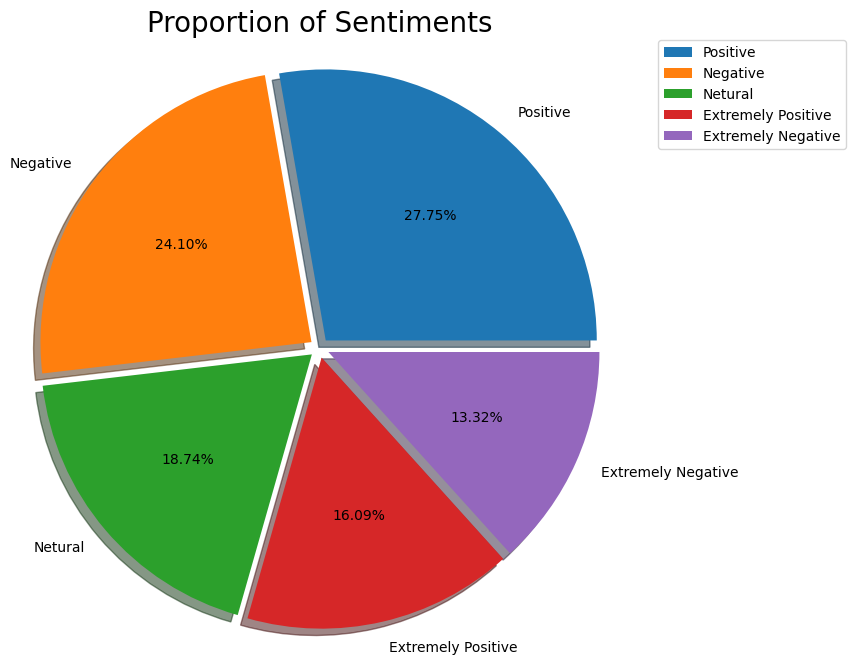

In [67]:
#plotting the piechart for Sentiment distribution
sentiment_count_df = df1['Sentiment'].value_counts().to_list()
labels = ['Positive','Negative','Netural','Extremely Positive','Extremely Negative' ]
plt.figure(figsize=(10,8))
plt.pie(x=sentiment_count_df, explode=[0.04, 0.04, 0.04, 0.04, 0.04], shadow = True, labels=labels, autopct="%.2f%%",radius=1.1)
plt.title("Proportion of Sentiments", fontsize = 20)
plt.legend(bbox_to_anchor = (1.05, 1), loc='upper left', borderaxespad = 0)
plt.show()

-> We have maximum number of Positive tweets

TEXT PREPROCESSING

In [68]:
#Convert to Lower Case
df["OriginalTweet"] = df["OriginalTweet"].str.lower()
df["OriginalTweet"]

0        @menyrbie @phil_gahan @chrisitv https://t.co/i...
1        advice talk to your neighbours family to excha...
2        coronavirus australia: woolworths to give elde...
3        my food stock is not the only one which is emp...
4        me, ready to go at supermarket during the #cov...
                               ...                        
41152    airline pilots offering to stock supermarket s...
41153    response to complaint not provided citing covi...
41154    you know itâs getting tough when @kameronwild...
41155    is it wrong that the smell of hand sanitizer i...
41156    @tartiicat well new/used rift s are going for ...
Name: OriginalTweet, Length: 41157, dtype: object

In [69]:
df.loc[:, 'OriginalTweet'] = df['OriginalTweet'].str.replace('http\S+ | www.\S+', '', case = False)

In [70]:
import string
def remove_punctuations(text):
    for punctuations in string.punctuation:
        text = text.replace(punctuations, '')
    return text

In [71]:
df["clean_tweets"] = df['OriginalTweet'].apply(lambda text : remove_punctuations(text))

In [72]:
df['clean_tweets']

0        menyrbie philgahan chrisitv httpstcoifz9fan2pa...
1        advice talk to your neighbours family to excha...
2        coronavirus australia woolworths to give elder...
3        my food stock is not the only one which is emp...
4        me ready to go at supermarket during the covid...
                               ...                        
41152    airline pilots offering to stock supermarket s...
41153    response to complaint not provided citing covi...
41154    you know itâs getting tough when kameronwilds...
41155    is it wrong that the smell of hand sanitizer i...
41156    tartiicat well newused rift s are going for 70...
Name: clean_tweets, Length: 41157, dtype: object

In [73]:
df['clean_tweets'] = df['clean_tweets'].str.replace("[^a-zA-Z#//]", " ")
df.head()

,OriginalTweet,Sentiment,clean_tweets
0,@menyrbie @phil_gahan @chrisitv https://t.co/i...,Neutral,menyrbie philgahan chrisitv httpstcoifz9fan2pa...
1,advice talk to your neighbours family to excha...,Positive,advice talk to your neighbours family to excha...
2,coronavirus australia: woolworths to give elde...,Positive,coronavirus australia woolworths to give elder...
3,my food stock is not the only one which is emp...,Positive,my food stock is not the only one which is emp...
4,"me, ready to go at supermarket during the #cov...",Extremely Negative,me ready to go at supermarket during the covid...


In [74]:
df['clean_tweets'][0]

'menyrbie philgahan chrisitv httpstcoifz9fan2pa and httpstcoxx6ghgfzcc and httpstcoi2nlzdxno8'

In [75]:
#removing stop words

import nltk 
from nltk.corpus import stopwords

nltk.download('stopwords')
", ".join(stopwords.words('english'))
STOPW = set(stopwords.words('english'))
to_delete = ["no","nor","aren't",'couldn',"couldn't",'didn',"didn't",'doesn',
            "doesn't",'don',"don't",'hadn',"hadn't",'hasn',"hasn't",'haven',"haven't",'isn',
             "isn't",'mightn',"mightn't",'mustn',"mustn't",'needn',"needn't",'no','not', "shan't",
            'shan',"shan't",'shouldn',"shouldn't","that'll",'wasn',"wasn't",'weren',"weren't","won't",
            'wouldn',"wouldn't"]
STOPW.difference_update(to_delete)

def remove_stopwords(text):
    return ([word for word in str(text).split() if word not in STOPW])

df['clean_tweets'] = df['clean_tweets'].apply(lambda x: remove_stopwords(x))    

[nltk_data] Error loading stopwords: <urlopen error [WinError 10060] A
[nltk_data]     connection attempt failed because the connected party
[nltk_data]     did not properly respond after a period of time, or
[nltk_data]     established connection failed because connected host
[nltk_data]     has failed to respond>


In [76]:
df.clean_tweets[1]

['advice',
 'talk',
 'neighbours',
 'family',
 'exchange',
 'phone',
 'numbers',
 'create',
 'contact',
 'list',
 'phone',
 'numbers',
 'neighbours',
 'schools',
 'employer',
 'chemist',
 'gp',
 'set',
 'online',
 'shopping',
 'accounts',
 'poss',
 'adequate',
 'supplies',
 'regular',
 'meds',
 'not',
 'order']

**STEMMING** :Stemming is the process of reducing a word to its word stem that affixes to suffixes and prefixes or to the roots of words known as a lemma.

In [77]:
from nltk.stem.porter import *
stemmer = PorterStemmer()

#function for stemming
def stemming(text):
    text = [stemmer.stem(word) for word in text]
    return(" ".join(text))

df['stemmed'] = df['clean_tweets'].apply(lambda x: stemming(x))
df.stemmed.head()

0    menyrbi philgahan chrisitv httpstcoifz9fan2pa ...
1    advic talk neighbour famili exchang phone numb...
2    coronaviru australia woolworth give elderli di...
3    food stock not one empti pleas dont panic enou...
4    readi go supermarket covid19 outbreak not im p...
Name: stemmed, dtype: object

**LEMMATIZING** : Lemmatization is the grouping together of different forms of the same word.

In [78]:
import nltk

# Download the wordnet resource
nltk.download('wordnet')

# Lemmatizing
from nltk.stem import WordNetLemmatizer
lemmatizer = WordNetLemmatizer()
df['lemmed'] = df['clean_tweets'].apply(lambda x: [lemmatizer.lemmatize(y) for y in x])

[nltk_data] Error loading wordnet: <urlopen error [WinError 10060] A
[nltk_data]     connection attempt failed because the connected party
[nltk_data]     did not properly respond after a period of time, or
[nltk_data]     established connection failed because connected host
[nltk_data]     has failed to respond>


In [79]:
df.head()

,OriginalTweet,Sentiment,clean_tweets,stemmed,lemmed
0,@menyrbie @phil_gahan @chrisitv https://t.co/i...,Neutral,"[menyrbie, philgahan, chrisitv, httpstcoifz9fa...",menyrbi philgahan chrisitv httpstcoifz9fan2pa ...,"[menyrbie, philgahan, chrisitv, httpstcoifz9fa..."
1,advice talk to your neighbours family to excha...,Positive,"[advice, talk, neighbours, family, exchange, p...",advic talk neighbour famili exchang phone numb...,"[advice, talk, neighbour, family, exchange, ph..."
2,coronavirus australia: woolworths to give elde...,Positive,"[coronavirus, australia, woolworths, give, eld...",coronaviru australia woolworth give elderli di...,"[coronavirus, australia, woolworth, give, elde..."
3,my food stock is not the only one which is emp...,Positive,"[food, stock, not, one, empty, please, dont, p...",food stock not one empti pleas dont panic enou...,"[food, stock, not, one, empty, please, dont, p..."
4,"me, ready to go at supermarket during the #cov...",Extremely Negative,"[ready, go, supermarket, covid19, outbreak, no...",readi go supermarket covid19 outbreak not im p...,"[ready, go, supermarket, covid19, outbreak, no..."


In [80]:
#Word Count 

df['temp_list'] = df['clean_tweets'].apply(lambda x:str(x).split())

In [81]:
df.head()

,OriginalTweet,Sentiment,clean_tweets,stemmed,lemmed,temp_list
0,@menyrbie @phil_gahan @chrisitv https://t.co/i...,Neutral,"[menyrbie, philgahan, chrisitv, httpstcoifz9fa...",menyrbi philgahan chrisitv httpstcoifz9fan2pa ...,"[menyrbie, philgahan, chrisitv, httpstcoifz9fa...","[['menyrbie',, 'philgahan',, 'chrisitv',, 'htt..."
1,advice talk to your neighbours family to excha...,Positive,"[advice, talk, neighbours, family, exchange, p...",advic talk neighbour famili exchang phone numb...,"[advice, talk, neighbour, family, exchange, ph...","[['advice',, 'talk',, 'neighbours',, 'family',..."
2,coronavirus australia: woolworths to give elde...,Positive,"[coronavirus, australia, woolworths, give, eld...",coronaviru australia woolworth give elderli di...,"[coronavirus, australia, woolworth, give, elde...","[['coronavirus',, 'australia',, 'woolworths',,..."
3,my food stock is not the only one which is emp...,Positive,"[food, stock, not, one, empty, please, dont, p...",food stock not one empti pleas dont panic enou...,"[food, stock, not, one, empty, please, dont, p...","[['food',, 'stock',, 'not',, 'one',, 'empty',,..."
4,"me, ready to go at supermarket during the #cov...",Extremely Negative,"[ready, go, supermarket, covid19, outbreak, no...",readi go supermarket covid19 outbreak not im p...,"[ready, go, supermarket, covid19, outbreak, no...","[['ready',, 'go',, 'supermarket',, 'covid19',,..."


In [82]:
from collections import Counter
top = Counter([item for sublist in df['temp_list'] for item in sublist])
temp = pd.DataFrame(top.most_common(20))
temp.columns = ['Common_words','count']
temp.style.background_gradient(cmap='Reds')

,Common_words,count
0,"'coronavirus',",14657
1,"'covid19',",14530
2,"'prices',",7561
3,"'food',",6674
4,"'store',",6656
5,"'supermarket',",6481
6,"'grocery',",5809
7,"'people',",5052
8,"'amp',",4921
9,"'not',",4269


-> 'coronavirus' and 'covid19' have very high frequency in our dataset

**SPLITING WORDS**

In [83]:
X = df['lemmed']
y = df['Sentiment']

X_train, X_test, y_train, y_test = train_test_split(X,y, test_size=0.3, stratify=y, random_state=10)

In [84]:
print(X_train.shape)
y_test.shape

(28809,)


(12348,)

In [85]:
print(X_train.head())
y_train.head()

7616     [stay, home, unless, essential, go, self, isol...
27184    [shopping, supermarket, replicates, squaddies,...
6444     [continue, monitor, situation, concerning, cov...
18114    [anyone, else, feel, like, today, iâm, gonna,...
27417    [friday, syria, daily, coronavirus, assad, reg...
Name: lemmed, dtype: object


7616     Extremely Positive
27184               Neutral
6444     Extremely Positive
18114              Positive
27417               Neutral
Name: Sentiment, dtype: object

In [86]:
frequency_list = []
import pprint
from collections import Counter

for i in X_train:
    frequency_list.append(Counter(i))
pprint.pprint(frequency_list)

[Counter({'home': 2,
          'stay': 1,
          'unless': 1,
          'essential': 1,
          'go': 1,
          'self': 1,
          'isolate': 1,
          'completely': 1,
          'symptom': 1,
          'considerate': 1,
          'supermarket': 1,
          'check': 1,
          'neighbour': 1,
          'give': 1,
          'elderly': 1,
          'vulnerable': 1,
          'relative': 1,
          'call': 1,
          'write': 1,
          'nice': 1,
          'letter': 1,
          'local': 1,
          'care': 1}),
 Counter({'time': 2,
          'shopping': 1,
          'supermarket': 1,
          'replicates': 1,
          'squaddies': 1,
          'experience': 1,
          'army': 1,
          'store': 1,
          'one': 1,
          'stand': 1,
          'behind': 1,
          'line': 1,
          'cant': 1,
          'matter': 1,
          'sign': 1,
          'bogroll': 1,
          'coronavirus': 1}),
 Counter({'3': 2,
          'continue': 1,
          'monit

In [87]:
from sklearn.feature_extraction.text import CountVectorizer
count_vector = CountVectorizer()
count_vector = X_train.tolist()
count_vector.fit(X_train)
doc_array = count_vector.transform(X_train).toarray()
print(doc_array)

AttributeError: 'list' object has no attribute 'fit'

In [ ]:
type(X_train)